In [1]:
import mlfinlab as ml
from freqml.download import *
from freqml import *
import numpy as np
import pandas as pd
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline



Support us on Patreon: https://www.patreon.com/HudsonThames

MlFinLab needs you! We need your help for us to keep on maintaining and implementing academic research based on 
financial machine learning (for open-source). In order for us to continue we need to raise $4000 of monthly donations
via Patreon - by December 2020. If we can't reach our goal, we will need to adopt more of a paid for service. We thought
that the best and least impactful course of action (should we not reach our goal) is to leave the package as open-source
but to make the documentation (ReadTheDocs) a paid for service. This is the ultimate litmus test, if the package is a 
value add, then we need the community to help us keep it going.

Our road map for 2020 is to implement the text book: Machine Learning for Asset Managers by Marcos Lopez de Prado, 
as well as a few papers from the Journal of Financial Data Science. We are hiring a full time developer for 3 months 
to help us reach our goals. The money that you

# 2.1 On a series of ETH tick data:

In [2]:
df = read("ETH")

In [3]:
df.drop(df.index[10000:], inplace=True)

In [3]:
df

,timestamp,id,side,price,amount,cost
0,1587257671467,0,buy,186.05,0.53734,99.972107
1,1587257672327,1,buy,186.05,1.00070,186.180235
2,1587257672885,2,buy,186.03,0.06085,11.319926
3,1587257673777,3,sell,186.02,0.70000,130.214000
4,1587257673787,4,sell,186.02,0.10000,18.602000
...,...,...,...,...,...,...
364631,1587398114654,364631,buy,178.94,0.10000,17.894000
364632,1587398114690,364632,sell,178.91,2.01769,360.984918
364633,1587398114813,364633,sell,178.90,0.10533,18.843537
364634,1587398114902,364634,sell,178.89,2.01095,359.738845


In [8]:
df_index = load('BTC')

In [ ]:
df_index.drop(df_index.index[10000:], inplace=True)

In [4]:
df_index=read('BTC')

In [5]:
df_index

,timestamp,id,side,price,amount,cost
0,1587257762221,0,buy,7223.92,0.198524,1434.121494
1,1587257762221,1,buy,7223.96,0.000162,1.170282
2,1587257763755,2,sell,7223.56,0.003164,22.855344
3,1587257763825,3,sell,7223.56,0.060033,433.651977
4,1587257763874,4,sell,7223.56,0.030642,221.344326
...,...,...,...,...,...,...
854141,1587400952640,854141,sell,7049.96,0.011935,84.141273
854142,1587400952762,854142,sell,7049.96,0.070700,498.432172
854143,1587400952858,854143,sell,7049.96,0.012774,90.056189
854144,1587400953458,854144,sell,7049.96,0.229820,1620.221807


In [6]:
df_index_tick = df_index.bars.TB()

## (a) Form tick, volume, and dollar bars. Use the ETF trick to deal with the roll.

### Form tick bars

#### Our realisation

In [7]:
df_tick = df.bars.TB()

In [8]:
df_tick.bars.plot()

#### MLfinlab realisation

In [9]:
df_ = df[["timestamp", "price", "amount"]]

In [10]:
df_tick_ = ml.data_structures.standard_data_structures.get_tick_bars(df_, threshold=100)

Reading data in batches:
Batch number: 0
Returning bars 



In [11]:
df_tick_.bars.plot()

### Form volume bars

#### Our realisation

In [12]:
df_volume = df.bars.VB(300)

/home/alexv/GitHub/freqml/freqml/bars.py:59: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [13]:
df_volume.bars.plot()

#### MLfinlab realisation

In [20]:
df_volume_ = ml.data_structures.standard_data_structures.get_volume_bars(df_, threshold=300)

Reading data in batches:
Batch number: 0
Returning bars 



In [21]:
df_volume_.bars.plot()

### From dollar bars

In [14]:
df_dollar = df.bars.DB(20000)
df_dollar_ = ml.data_structures.standard_data_structures.get_dollar_bars(df_, threshold=20000)

/home/alexv/GitHub/freqml/freqml/bars.py:67: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Reading data in batches:
Batch number: 0
Returning bars 



In [15]:
df_dollar.bars.plot()

In [16]:
df_dollar_.bars.plot()

### (b) Count the number of bars produced by tick, volume, and dollar bars on a weekly basis. Plot a time series of that bar count. What bar type produces the most stable weekly count? Why?

#### Our realisation

In [17]:
print('Count the number of bars produced by tick:', df_tick.shape[0])
print('Count the number of bars produced by volume:', df_volume.shape[0])
print('Count the number of bars produced by dollar:', df_dollar.shape[0])

Count the number of bars produced by tick: 3646
Count the number of bars produced by volume: 5961
Count the number of bars produced by dollar: 15540


In [18]:
count_df = pd.DataFrame(columns=['count_mean','count_std'], index=['tick', 'volume', 'dollar'])
count_df.loc['tick'] = [np.mean(df_tick.VWAP), np.std(df_tick.VWAP)]
count_df.loc['volume'] = [np.mean(df_volume.VWAP), np.std(df_volume.VWAP)]
count_df.loc['dollar'] = [np.mean(df_dollar.VWAP), np.std(df_dollar.VWAP)]
count_df

,count_mean,count_std
tick,181.366,2.87702
volume,181.089,3.01285
dollar,181.175,2.99018


#### MLfinlab realisation

In [22]:
print('Count the number of bars produced by tick:', df_tick_.shape[0])
print('Count the number of bars produced by volume:', df_volume_.shape[0])
print('Count the number of bars produced by dollar:', df_dollar_.shape[0])

Count the number of bars produced by tick: 3646
Count the number of bars produced by volume: 5577
Count the number of bars produced by dollar: 13752


In [23]:
count_df = pd.DataFrame(columns=['count_mean','count_std'], index=['tick', 'volume', 'dollar'])
count_df.loc['tick'] = [np.mean(df_tick_.close), np.std(df_tick_.close)]
count_df.loc['volume'] = [np.mean(df_volume_.close), np.std(df_volume_.close)]
count_df.loc['dollar'] = [np.mean(df_dollar_.close), np.std(df_dollar_.close)]
count_df

,count_mean,count_std
tick,181.367,2.8761
volume,181.115,3.00029
dollar,181.182,2.98279


### (c) Compute the serial correlation of returns for the three bar types. What bar method has the lowest serial correlation?

#### Our realisation

In [24]:
# log function
log_df_tick = np.log(df_tick.VWAP).diff().dropna()
log_df_volume = np.log(df_volume.VWAP).diff().dropna()
log_df_dollar = np.log(df_dollar.VWAP).diff().dropna()

In [25]:
autocorr_df = pd.DataFrame(data={'autocorr':[log_df_tick.autocorr(),  
                                                    log_df_volume.autocorr(), 
                                                    log_df_dollar.autocorr()]},
                               index=['tick', 'volume', 'dollar'])
autocorr_df

,autocorr
tick,0.224216
volume,0.277032
dollar,0.264064


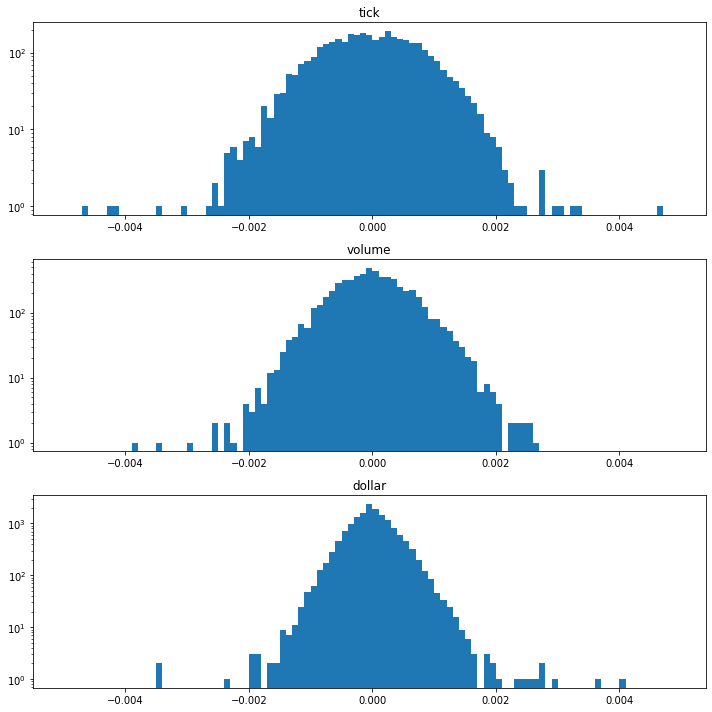

In [26]:
bins = np.arange(-0.005,0.005, 0.0001)
fig, ax = plt.subplots(3,1, figsize = (10,10))
ax[0].hist(log_df_tick, bins=bins)
ax[0].set_title('tick')
ax[1].hist(log_df_volume, bins=bins)
ax[1].set_title('volume')
ax[2].hist(log_df_dollar, bins=bins)
ax[2].set_title('dollar')
[a.set_yscale('log') for a in ax]

fig.tight_layout()

#### MLfinlab realisation

In [27]:
# log function
log_df_tick_ = np.log(df_tick_.close).diff().dropna()
log_df_volume_ = np.log(df_volume_.close).diff().dropna()
log_df_dollar_ = np.log(df_dollar_.close).diff().dropna()

In [28]:
autocorr_df_ = pd.DataFrame(data={'autocorr':[log_df_tick_.autocorr(),  
                                                    log_df_volume_.autocorr(), 
                                                    log_df_dollar_.autocorr()]},
                               index=['tick', 'volume', 'dollar'])
autocorr_df_

,autocorr
tick,-0.002394
volume,0.037515
dollar,0.013827


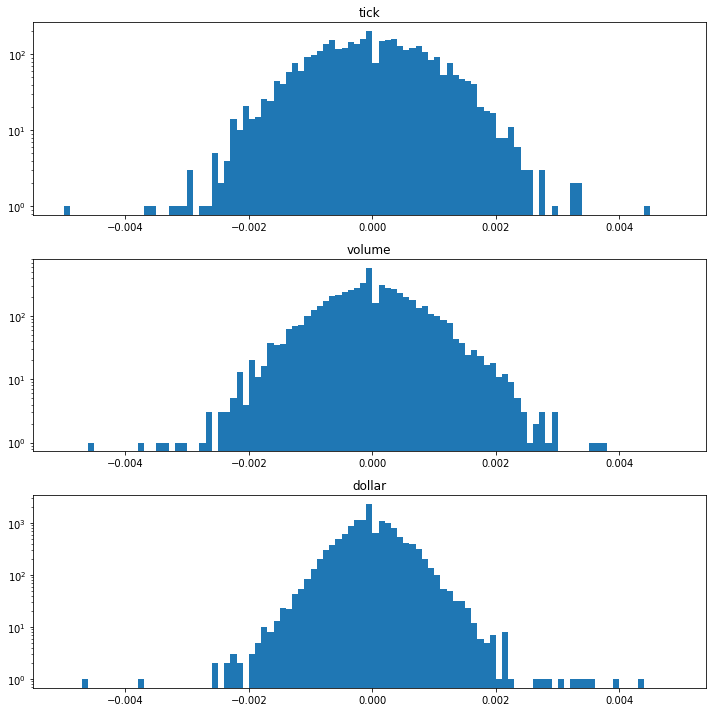

In [29]:
bins = np.arange(-0.005,0.005, 0.0001)
fig, ax = plt.subplots(3,1, figsize = (10,10))
ax[0].hist(log_df_tick_, bins=bins)
ax[0].set_title('tick')
ax[1].hist(log_df_volume_, bins=bins)
ax[1].set_title('volume')
ax[2].hist(log_df_dollar_, bins=bins)
ax[2].set_title('dollar')
[a.set_yscale('log') for a in ax]

fig.tight_layout()

### (d) Partition the bar series into monthly subsets. Compute the variance of returns for every subset of every bar type. Compute the variance of those variances. What method exhibits the smallest variance of variances?

#### Our realisation

In [30]:
#Future realisation
'''
monthly_ticks_var = log_df_tick.resample('M').var()
monthly_volume_var = log_df_volume.resample('M').var()
monthly_dollar_var = log_df_dollar.resample('M').var()
'''
month_ticks_var = log_df_tick.var()
month_volume_var = log_df_volume.var()
month_dollar_var = log_df_dollar.var()

In [31]:
#Future realisation
'''monthly_var_df = pd.DataFrame(data={'monthly_var' : [monthly_ticks_var.var(),  
                                                        monthly_volume_var.var(),
                                                        monthly_dollar_var.var()]
                                       },
                                  index=['tick', 'volume', 'dollar'])
monthly_var_df
'''

"monthly_var_df = pd.DataFrame(data={'monthly_var' : [monthly_ticks_var.var(),  \n                                                        monthly_volume_var.var(),\n                                                        monthly_dollar_var.var()]\n                                       },\n                                  index=['tick', 'volume', 'dollar'])\nmonthly_var_df\n"

### (e) Apply the Jarque-Bera normality test on returns from the three bar types. What method achieves the lowest test statistic?

#### Our realisation

In [32]:
from scipy.stats import jarque_bera

In [33]:
jb_value_tick, _ = jarque_bera(log_df_tick)
jb_value_volume, _ = jarque_bera(log_df_volume)
jb_value_dollar, _ = jarque_bera(log_df_dollar)

In [34]:
jb_test_df = pd.DataFrame(data={'jarque_bera_results' : [jb_value_tick,  
                                                         jb_value_volume,
                                                         jb_value_dollar]
                               },
                          index=['tick', 'volume', 'dollar'])
jb_test_df

,jarque_bera_results
tick,1999.523945
volume,1410.090880
dollar,13144.551321


In [35]:
pd.concat([count_df, autocorr_df, jb_test_df],axis=1) #and add monthly_var_df in the future

,count_mean,count_std,autocorr,jarque_bera_results
tick,181.367,2.8761,0.224216,1999.523945
volume,181.115,3.00029,0.277032,1410.090880
dollar,181.182,2.98279,0.264064,13144.551321


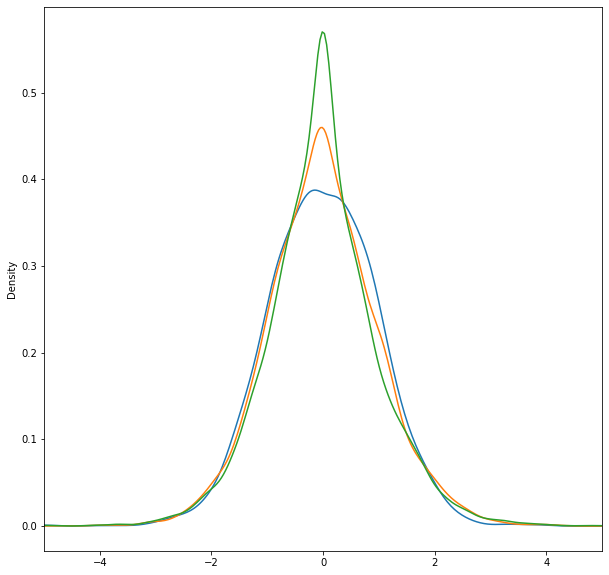

In [36]:
tick_standard = (log_df_tick - log_df_tick.mean()) / log_df_tick.std()
volume_standard = (log_df_volume - log_df_volume.mean()) / log_df_volume.std()
dollar_standard = (log_df_dollar - log_df_dollar.mean()) / log_df_dollar.std()

fig, ax = plt.subplots(1,1, figsize = (10,10))
tick_standard.plot.density(ax=ax,
                           xlim=(-5,5),
                            label="Tick")
volume_standard.plot.density(ax=ax,
                             xlim=(-5,5),
                            label="Volume")
dollar_standard.plot.density(ax=ax,
                             xlim=(-5,5),
                            label="Dollar")

(-5, 5)

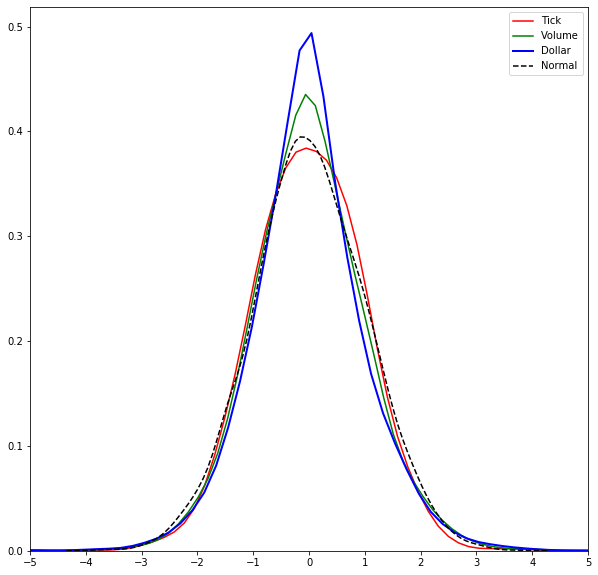

In [37]:
fig, ax = plt.subplots(figsize=(10,10))
#sns.kdeplot(time_standard, label="Time", bw=0.30, color='darkred')
sns.kdeplot(tick_standard, 
            ax=ax,
            label="Tick", 
            bw=0.25,
            color='red')
sns.kdeplot(volume_standard,
            ax=ax,
            label="Volume",
            bw=0.25,
            color='green')
sns.kdeplot(dollar_standard,
            ax=ax,
            label="Dollar",
            bw=0.25,
            linewidth=2,
            color='blue')
sns.kdeplot(np.random.normal(size=len(tick_standard)),
            ax=ax,
            label="Normal",
            color='black',
            linestyle="--")
ax.set_xticks(range(-5, 6))
ax.set_xlim(-5, 5)

### 2.2 On a series of E-mini S&P 500 futures tick data, compute dollar bars and dollar imbalance bars. What bar type exhibits greater serial correlation? Why?

#### MLfinlab realisation

In [38]:
df_dollar_imb = ml.data_structures.imbalance_data_structures.get_const_dollar_imbalance_bars(df_, expected_imbalance_window=238, exp_num_ticks_init=100)

Reading data in batches:
Batch number: 0
Returning bars 



In [39]:
df_dollar_imb

(         date_time  tick_num    open    high     low   close      volume  \
 0     1.587258e+12       100  186.05  186.05  185.79  185.97   363.75250   
 1     1.587258e+12       112  185.98  186.00  185.98  186.00    78.58819   
 2     1.587258e+12       157  186.00  186.12  186.00  186.12   113.87366   
 3     1.587258e+12       199  186.13  186.22  186.11  186.22   163.03535   
 4     1.587258e+12       289  186.22  186.24  186.07  186.10   319.15494   
 ...            ...       ...     ...     ...     ...     ...         ...   
 1632  1.587398e+12    363898  179.80  180.25  179.07  179.27  8516.91521   
 1633  1.587398e+12    364023  179.27  179.27  179.15  179.20   564.11998   
 1634  1.587398e+12    364040  179.20  179.20  179.20  179.20   229.25450   
 1635  1.587398e+12    364285  179.26  179.36  179.00  179.00  1066.25286   
 1636  1.587398e+12    364354  179.00  179.00  178.80  178.80   300.78300   
 
       cum_buy_volume  cum_ticks  cum_dollar_value  
 0           71.19979

In [40]:
log_df_dollar_imb = np.log(df_dollar_imb.close).diff().dropna()

AttributeError: 'tuple' object has no attribute 'close'

In [41]:
log_df_dollar_ = np.log(df_dollar_.close).diff().dropna()

### 2.4 Form futures dollar bars: (a) Compute Bollinger bands of width 5% around a rolling moving average. Count how many times prices cross the bands out (from within the bands to outside the bands).

#### Our realisation

In [42]:
df_dollar

,open,high,low,close,amount,VWAP
timestamp,,,,,,
1587257674161,186.05,186.05,186.02,186.02,106.17098,186.020440
1587257674454,186.02,186.02,185.91,185.92,108.15516,186.000658
1587257680385,185.92,185.94,185.79,185.90,102.26423,185.878472
1587257683613,185.90,186.00,185.88,186.00,110.80622,185.959714
1587257703621,186.00,186.11,186.00,186.11,109.39276,186.066697
...,...,...,...,...,...,...
1587398088159,178.90,178.90,178.77,178.77,67.35977,178.853475
1587398089263,178.81,178.81,178.79,178.79,157.70273,178.801078
1587398090275,178.79,178.79,178.78,178.79,110.25996,178.789994


In [43]:
N = 20
k = 2
ma = df_dollar.VWAP.rolling(N).mean()
sigma = df_dollar.VWAP.rolling(N).std()
upper_band = ma + k*sigma
lower_band = ma - k*sigma

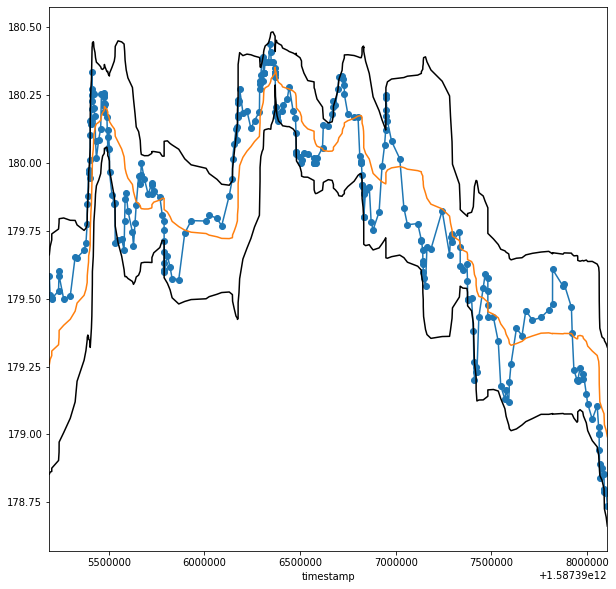

In [44]:
start = -300
fig, ax = plt.subplots(1, figsize = (10,10))
df_dollar.iloc[start:].VWAP.plot(ax=ax, marker='o')
ma.iloc[start:].plot(ax=ax)
upper_band.iloc[start:].plot(ax=ax, color='k')
lower_band.iloc[start:].plot(ax=ax, color='k')

In [45]:
from mlfinlab import filters
mlfinlabcusum = filters.cusum_filter(df_dollar_.close, 0.05)
len(mlfinlabcusum)

3

In [46]:
def getevents(raw,h):
    events = []
    position = 0
    n = 0
  
    diff=np.log(raw).diff()
    for i in diff.index[1:]:
        position =max(0,position+diff.loc[i])
        n = min(0,n+diff.loc[i])
    if n<-h:
        n=0
        events.append(i)
    elif position>h:
        sPos=0
        events.append(i)
    return events

### Other operations

#### Our realisation

In [47]:
df_TIB = df.bars.TIB(100)

/home/alexv/GitHub/freqml/freqml/bars.py:75: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/alexv/GitHub/freqml/freqml/bars.py:76: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/alexv/GitHub/freqml/.env/lib64/python3.7/site-packages/pandas/core/indexing.py:376: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide

In [48]:
df_TIB.bars.plot()

In [49]:
df_dollar_imb_ = ml.data_structures.imbalance_data_structures.get_ema_dollar_imbalance_bars(df_, 20)

Reading data in batches:
Batch number: 0
Returning bars 



In [50]:
df_dollar_imb_

(      date_time  tick_num    open    high     low   close        volume  \
 0  1.587273e+12     30596  186.05  188.35  185.43  185.43  137008.51087   
 1  1.587295e+12     93715  185.43  185.44  178.59  181.73  300283.32151   
 2  1.587383e+12    301517  181.73  186.46  175.75  177.00  985764.13869   
 
    cum_buy_volume  cum_ticks  cum_dollar_value  
 0     64268.47367      30596      2.558045e+07  
 1    141239.66911      63119      5.478050e+07  
 2    473668.66688     207802      1.787009e+08  ,
 Empty DataFrame
 Columns: []
 Index: [])